## Goals:
1. Generate some data to train on 
    - pick a mean (keep variance fixed) and some change points
    - generate a large length of x values
2. Detect changepoints


## Next:
1. implement segment detection (not just changepoint detection)


In [1]:
import math
import numpy as np
import scipy.stats
from functools import partial

In [2]:
class BOCD(object):
    def __init__(self, hazard_function, observation_likelihood):
        """Initializes th detector with zero observations.
        """
        self.t0 = 0
        self.t = -1
        self.growth_probs = np.array([1.])
        self.hazard_function = hazard_function
        self.observation_likelihood = observation_likelihood

    def update(self, x):
        """Updates changepoint probabilities with a new data point.
        """
        self.t += 1

        t = self.t - self.t0
        
        # Change length of array
        temp = self.growth_probs
        self.growth_probs = np.zeros(t+2)
        self.growth_probs[:(t+1)] = temp[:(t+1)]

        # Evaluate the predictive distribution for the new datum under each of
        # the parameters.  This is the standard thing from Bayesian inference.
        pred_probs = self.observation_likelihood.pdf(x)
        # pred_probs = pred_probs/np.sum(pred_probs)
        print(np.shape(pred_probs))
        print(pred_probs)

        # Evaluate the hazard function for this interval
        H = self.hazard_function(np.array(range(t + 1)))

        # Evaluate the probability that there *was* a changepoint and we're
        # accumulating the mass back down at r = 0.
        cp_prob = np.sum(self.growth_probs[0:t + 1] * pred_probs * H)

        # Evaluate the growth probabilities - shift the probabilities down and to
        # the right, scaled by the hazard function and the predictive
        # probabilities.
        self.growth_probs[1:t + 2] = self.growth_probs[0:t + 1] * pred_probs * (1-H)
        # Put back changepoint probability
        self.growth_probs[0] = cp_prob

        # Renormalize the run length probabilities for improved numerical
        # stability.
        self.growth_probs[:] = self.growth_probs[:] / \
            np.sum(self.growth_probs[:])

        # Update the parameter sets for each possible run length.
        self.observation_likelihood.update_theta(x)

    def prune(self, t0):
        """prunes memory before time t0. That is, pruning at t=0
        does not change the memory. One should prune at times
        which are likely to correspond to changepoints.
        """
        self.t0 = t0
        self.observation_likelihood.prune(self.t - t0 + 1)


def constant_hazard(lam, r):
    """Computes the "constant" hazard, that is corresponding
    to Poisson process.
    """
    return 1/lam * np.ones(r.shape)

In [3]:
class StudentT:
    """Student's t predictive posterior.
    """
    def __init__(self, alpha, beta, kappa, mu):
        self.alpha0 = self.alpha = np.array([alpha])
        self.beta0 = self.beta = np.array([beta])
        self.kappa0 = self.kappa = np.array([kappa])
        self.mu0 = self.mu = np.array([mu])

    def pdf(self, data):
        """PDF of the predictive posterior.
        """
        return scipy.stats.t.pdf(x=data,
                                 df=2*self.alpha,
                                 loc=self.mu,
                                 scale=np.sqrt(self.beta * (self.kappa+1) /
                                                  (self.alpha * self.kappa)))

    def update_theta(self, data):
        """Bayesian update.
        """
        muT0 = np.concatenate((self.mu0, (self.kappa * self.mu + data) /
                                            (self.kappa + 1)))
        kappaT0 = np.concatenate((self.kappa0, self.kappa + 1.))
        alphaT0 = np.concatenate((self.alpha0, self.alpha + 0.5))
        betaT0 = np.concatenate((self.beta0,
                                    self.beta +
                                    (self.kappa * (data - self.mu)**2) /
                                    (2. * (self.kappa + 1.))))

        self.mu = muT0
        self.kappa = kappaT0
        self.alpha = alphaT0
        self.beta = betaT0
        
    def prune(self, t):
        """Prunes memory before t.
        """
        self.mu = self.mu[:t + 1]
        self.kappa = self.kappa[:t + 1]
        self.alpha = self.alpha[:t + 1]
        self.beta = self.beta[:t + 1]

# Generate data to detect changepoints

In [4]:
xs = np.random.normal(size=1000)
xs[len(xs) // 4:len(xs) // 2] += 10.
xs[len(xs) // 2:3 * len(xs) // 4] -= 10. 
xs = xs/30
xs = xs +0.5

# Change this from 100 to 200 to 400 to 1000 to see the effect of number of samples on run length detection
# xs = np.random.normal(size=200)
# xs[len(xs) // 4:len(xs) // 2] += 10.
# xs[len(xs) // 2:3 * len(xs) // 4] -= 10. 
# xs = xs/30
# xs = xs +0.5

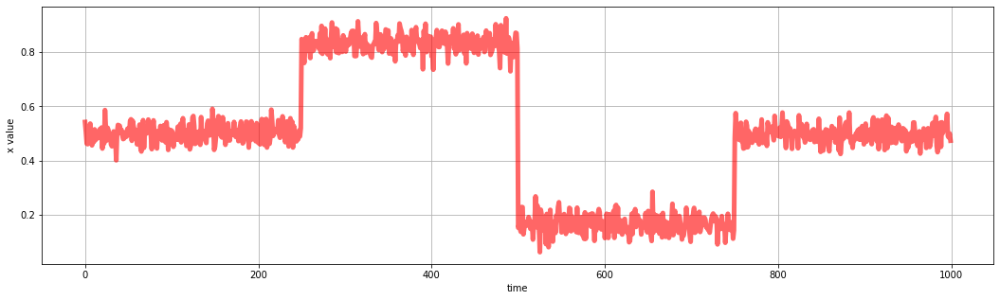

In [6]:
import matplotlib.pyplot as plt
plt.figure(figsize=(18, 5))
# plt.subplot(121)
plt.plot(xs,'r-', lw=5, alpha=0.6, label='t pdf')
plt.ylabel('x value')
plt.xlabel('time')
plt.grid('on')
plt.show()

# Run BOCPD

In [7]:
LAMBDA = 100
ALPHA = 0.1
BETA = 1.
KAPPA = 1.
MU = 0.
DELAY = 15
THRESHOLD = 0.5

bocd = BOCD(partial(constant_hazard, LAMBDA),
                StudentT(ALPHA, BETA, KAPPA, MU))
changepoints = []
list_of_p_r = []
for x_t in xs[:DELAY]:
    bocd.update(x_t)
    list_of_p_r.append(bocd.growth_probs)
    
for x_t in xs[DELAY:]:
    bocd.update(x_t)    
    if (abs(sum(bocd.growth_probs) -1)>0.0001):
        print("Error: Prob sum is not 1. Sum is", sum(bocd.growth_probs))
    list_of_p_r.append(bocd.growth_probs)
    if bocd.growth_probs[DELAY] >= THRESHOLD:
        changepoints.append(bocd.t - DELAY + 1)
        print("Changepoint found at ",changepoints[-1],"\n")
#         bocd.prune(bocd.t - DELAY)

(1,)
[0.04231876]
(2,)
[0.04254486 0.19712915]
(3,)
[0.04279823 0.19872648 0.30836641]
(4,)
[0.04280856 0.19908823 0.30916202 0.3969691 ]
(5,)
[0.04254943 0.19758166 0.30682388 0.39437471 0.46879284]
(6,)
[0.04276648 0.19857205 0.30881447 0.39728839 0.47245608 0.53823497]
(7,)
[0.04235582 0.1963717  0.30470729 0.39135391 0.46494435 0.53008043
 0.58892483]
(8,)
[0.0427022  0.19796816 0.30792255 0.39600921 0.47121628 0.53758412
 0.59738051 0.65172541]
(9,)
[0.04283272 0.19911432 0.30889399 0.39749093 0.47270367 0.53935992
 0.59954443 0.65437532 0.70442203]
(10,)
[0.04277067 0.19890457 0.30905274 0.39690095 0.47228179 0.53858975
 0.5986748  0.65380453 0.70471728 0.75166533]
(11,)
[0.04276367 0.19881164 0.30904368 0.39743519 0.47219167 0.53871654
 0.59856309 0.6536797  0.70485112 0.75252611 0.7967403 ]
(12,)
[0.04248826 0.19719295 0.30616373 0.39340743 0.46774892 0.53328436
 0.59239926 0.64679854 0.69694271 0.7438574  0.78845587 0.83063162]
(13,)
[0.04272459 0.19827454 0.30833481 0.3966690

(156,)
[0.04258297 0.19711131 0.30650444 0.39398026 0.46883284 0.53469114
 0.59392508 0.6481274  0.69747568 0.74491797 0.78962289 0.83210038
 0.87260661 0.91091218 0.94785184 0.98346599 1.01792907 1.05140742
 1.08389921 1.11544445 1.14606022 1.17502079 1.20375261 1.23222375
 1.26005047 1.28728128 1.31396054 1.3397652  1.36500559 1.38993772
 1.41337261 1.43655945 1.46041104 1.48324571 1.50527127 1.52764541
 1.54971369 1.57116072 1.59224354 1.61371051 1.63483233 1.65573184
 1.67523708 1.69506335 1.71483763 1.73428203 1.75394002 1.77322717
 1.79224083 1.81110583 1.82982702 1.84836508 1.86668821 1.88403217
 1.90212504 1.92000747 1.93770659 1.95530688 1.97266185 1.98842012
 2.00553938 2.02175572 2.03814232 2.0548282  2.07096628 2.08713893
 2.10315666 2.11928134 2.13497134 2.15089328 2.16655846 2.18221185
 2.1963911  2.21185492 2.22689123 2.24213127 2.2561345  2.27094334
 2.28428551 2.29910307 2.31346793 2.32791012 2.34112617 2.35554367
 2.36990556 2.38396762 2.3980664  2.41076845 2.42352314

(258,)
[0.04021402 0.18288999 0.28258685 0.36288643 0.43120175 0.49159285
 0.54610915 0.59609657 0.6323243  0.66225455 0.69031178 0.71282635
 0.73347322 0.75030098 0.76615264 0.7799234  0.79555036 0.80315188
 0.81707864 0.82441872 0.83684588 0.84292969 0.84497665 0.85012392
 0.85794915 0.86184645 0.86201544 0.86380824 0.86705022 0.87294967
 0.873955   0.87358694 0.87169573 0.87031259 0.87270916 0.87150062
 0.87060056 0.86841692 0.86597538 0.86261816 0.8583957  0.85807801
 0.86092417 0.85582462 0.84847185 0.84591741 0.84079346 0.8319771
 0.83086374 0.82319217 0.81474926 0.81299319 0.80760209 0.80570367
 0.79900553 0.79027285 0.78204568 0.7735877  0.76805459 0.76443236
 0.75623897 0.7486453  0.74330222 0.73770557 0.72989228 0.72637521
 0.71829545 0.71316514 0.70362871 0.6992706  0.69538009 0.69151568
 0.6843567  0.6772351  0.66889181 0.66030266 0.65437558 0.6504512
 0.64540478 0.63940971 0.63135766 0.62536762 0.61855358 0.61134808
 0.60450342 0.60043801 0.59368626 0.58696917 0.58035369 0

(340,)
[0.04033518 0.1833126  0.28319743 0.36287477 0.43151917 0.49208452
 0.54683378 0.59709191 0.64374134 0.68744147 0.72871069 0.76787566
 0.80518124 0.84093009 0.87518466 0.90826783 0.93961409 0.97022598
 1.00016778 1.0291872  1.0570917  1.08465772 1.11146738 1.13726062
 1.16053737 1.18541579 1.20988679 1.23391406 1.25743576 1.27947285
 1.30191855 1.32309797 1.3441248  1.36532257 1.38649798 1.40718175
 1.42776251 1.4477265  1.46778772 1.48743212 1.5069639  1.52544851
 1.54447571 1.56295624 1.58120347 1.59956699 1.61768372 1.63523126
 1.65125552 1.66878341 1.68421343 1.70058159 1.71685215 1.73362909
 1.74703338 1.76273494 1.7787513  1.79452078 1.81046101 1.82624762
 1.84144099 1.85703798 1.87041421 1.8857379  1.90030955 1.9153166
 1.92754138 1.94233762 1.95576215 1.97034205 1.984458   1.99859018
 2.012613   2.02639387 2.04026903 2.05423975 2.06811166 2.08049598
 2.09341229 2.1066712  2.11934713 2.13275185 2.14600053 2.15924087
 2.17155449 2.18463233 2.19674069 2.20959094 2.22209404 

(413,)
[0.03972603 0.17997971 0.27814757 0.35682911 0.4238018  0.4829604
 0.53646499 0.58556235 0.63097877 0.67362511 0.71143253 0.74858353
 0.7836918  0.81835741 0.85133659 0.88336693 0.91434239 0.94388526
 0.97191981 1.00008975 1.02718396 1.05397916 1.0762318  1.10145979
 1.12556369 1.14902142 1.17229966 1.19520062 1.2178827  1.24007859
 1.26213487 1.28376951 1.30499935 1.32409974 1.34393979 1.3642736
 1.38292966 1.40213963 1.42026928 1.43904237 1.45731105 1.47583368
 1.49201247 1.50872194 1.52592904 1.54206436 1.55951432 1.57686574
 1.59401695 1.61084678 1.62713199 1.64365421 1.65961068 1.67543239
 1.68772636 1.70304503 1.71641324 1.72967791 1.74473647 1.75978792
 1.77363133 1.78640215 1.80134089 1.81518972 1.82988236 1.84445771
 1.85826401 1.87100794 1.88494714 1.89692458 1.90960776 1.92340894
 1.93577893 1.9476562  1.96054172 1.97402148 1.98723355 1.99963062
 2.01215428 2.02430046 2.03621877 2.04558586 2.05502918 2.0650812
 2.07619103 2.08761216 2.09860269 2.11009728 2.11987905 2.

(469,)
[0.04048502 0.1837108  0.28445199 0.36529855 0.43422021 0.49439159
 0.54945425 0.60000031 0.6463739  0.68998367 0.73103391 0.77017045
 0.80758701 0.84302177 0.87748416 0.90981827 0.94137348 0.97171923
 1.00164577 1.03080879 1.05851348 1.08492597 1.11175961 1.13724525
 1.16212947 1.18626513 1.21074381 1.23340444 1.25679329 1.27918515
 1.30194452 1.32299838 1.34482525 1.36634284 1.38736615 1.40774319
 1.42832663 1.44535465 1.46360087 1.48233408 1.50180139 1.52028458
 1.53911517 1.55516237 1.5731338  1.59038282 1.60714843 1.62366436
 1.64100737 1.65813908 1.67506192 1.69139036 1.70606252 1.72225054
 1.73768324 1.75342976 1.76713898 1.78178983 1.7968233  1.81230071
 1.82763021 1.84236442 1.85494843 1.86884069 1.88336347 1.8972432
 1.91107593 1.92577228 1.94035076 1.95325926 1.96709362 1.97993242
 1.99235535 2.0059423  2.01983109 2.02891915 2.04196613 2.05269917
 2.06522688 2.07743583 2.09045313 2.10344657 2.11599727 2.12828558
 2.13991969 2.15164287 2.16049978 2.17111444 2.18191156 

(528,)
[0.04389281 0.20623052 0.3202855  0.4121382  0.49037729 0.55927345
 0.62142858 0.67781949 0.73085869 0.78043018 0.82575545 0.86995321
 0.91217129 0.9521307  0.99089737 1.02835033 1.06416678 1.09902242
 1.13279968 1.1655988  1.19702316 1.22678003 1.25696668 1.2864233
 1.31428161 1.34187178 1.36927053 1.39578758 1.31061557 1.22877821
 1.16469997 1.11919251 1.09016899 1.05751195 1.02970505 1.00657896
 0.99474956 0.97289371 0.95172152 0.93711754 0.92408328 0.90136616
 0.88868896 0.87801641 0.86482052 0.85465037 0.8402967  0.82606019
 0.82068127 0.81236697 0.80323185 0.79344323 0.78380632 0.77220529
 0.76441621 0.7562188  0.7478246  0.74111806 0.73478677 0.72881389
 0.72023719 0.71322953 0.70620891 0.69927778 0.69105558 0.68511864
 0.67936135 0.67216644 0.66550327 0.65883522 0.65268808 0.64692414
 0.64047555 0.63530086 0.62858137 0.62236543 0.61605593 0.61055822
 0.60543434 0.59930978 0.59288492 0.58759896 0.5815974  0.57567391
 0.56971092 0.56458482 0.55853292 0.55445142 0.54884568 

[0.04407379 0.20695212 0.32271259 0.41526531 0.4943414  0.56329609
 0.62590345 0.68334239 0.73679845 0.78681106 0.8315269  0.87614533
 0.91753605 0.95787375 0.99649517 1.03391004 1.06858944 1.10354811
 1.1343604  1.16382014 1.19523848 1.22616944 1.2557684  1.28535847
 1.31375845 1.33953813 1.36566692 1.3921832  1.41864336 1.44316147
 1.46691352 1.48578341 1.50559846 1.52814213 1.54925157 1.57248565
 1.59395336 1.61527091 1.63764916 1.65823869 1.67944    1.69642125
 1.71736944 1.73797942 1.75762421 1.77455778 1.7946044  1.81364706
 1.83086851 1.84988497 1.86835272 1.8839715  1.8977403  1.91545336
 1.93303397 1.94648715 1.95773417 1.97466715 1.98136065 1.99641671
 2.01204499 2.02917148 2.04467234 2.05950222 2.07544268 2.08995688
 2.10318565 2.11816528 2.13223833 2.1462104  2.16003292 2.17488564
 2.19032574 2.19902854 2.20749008 2.22229192 2.23659689 2.25007361
 2.26400559 2.07319432 1.90351375 1.77170148 1.67449337 1.60589741
 1.53626923 1.47674728 1.42632589 1.39293951 1.34855634 1.3070

[0.04401381 0.20713454 0.32283539 0.41572258 0.4946583  0.56430258
 0.62729239 0.68505906 0.7387191  0.78878438 0.83610406 0.88108931
 0.9225432  0.96355489 1.00100019 1.03709846 1.0733401  1.10747272
 1.14141805 1.17465642 1.20698718 1.23847129 1.2682917  1.29796529
 1.32684264 1.35448074 1.3825589  1.40972028 1.43659479 1.46298833
 1.48869546 1.51427951 1.53939499 1.56269659 1.58497421 1.60775611
 1.63041931 1.65365126 1.67646463 1.69832619 1.72055581 1.74122813
 1.76155557 1.78296633 1.80402576 1.82370789 1.84390351 1.86421631
 1.88378674 1.90324374 1.92129222 1.94030195 1.95940906 1.97839672
 1.99646661 2.0152239  2.0338572  2.05224304 2.07052212 2.08556877
 2.10348209 2.12043539 2.13805412 2.15549251 2.17286604 2.18895348
 2.20601985 2.22001441 2.23357707 2.25016976 2.26669435 2.28294807
 2.29909084 2.31522379 2.32959876 2.34484142 2.36062936 2.37628988
 2.39126482 2.40592491 2.41577831 2.42725614 2.44181604 2.45541308
 2.47028145 2.48464376 2.49906067 2.51257586 2.52676914 2.5412

[0.04394824 0.20666717 0.32184764 0.41413616 0.49281793 0.56225587
 0.62473135 0.6822694  0.73550016 0.78543269 0.83241065 0.87709071
 0.91963401 0.96009099 0.99647846 1.03284392 1.0685015  1.10364067
 1.13771729 1.17045346 1.20218233 1.23337664 1.26372317 1.29347088
 1.32266685 1.35123483 1.37908033 1.40571067 1.43262801 1.45905378
 1.4850011  1.51036387 1.53536699 1.55988146 1.58347407 1.60736726
 1.63058173 1.65291449 1.67555729 1.69789981 1.71799626 1.73744501
 1.75873946 1.7793138  1.80028238 1.82059599 1.84123472 1.86166243
 1.88176727 1.90064127 1.91967266 1.93924043 1.95858614 1.97702756
 1.99486935 2.01326186 2.03023465 2.04729184 2.0636696  2.08110588
 2.09903492 2.11645561 2.13340762 2.15067643 2.16770676 2.18289542
 2.19991592 2.21646951 2.23285416 2.24741739 2.26386831 2.28018158
 2.29646369 2.31210483 2.32795767 2.34334543 2.35814021 2.37351878
 2.38894526 2.40376156 2.41905584 2.43131537 2.44634895 2.46104793
 2.4756246  2.49028448 2.50501205 2.51942395 2.53406395 2.5485

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0.04283257 0.19930098 0.30943276 0.39774661 0.47279598 0.53938855
 0.59922607 0.65427126 0.7053954  0.75292243 0.79816105 0.84111653
 0.88204797 0.92097913 0.95811366 0.99278465 1.02613635 1.05987107
 1.09206845 1.12375564 1.15467797 1.18475486 1.2141412  1.24234437
 1.2702769  1.29689873 1.32365503 1.34892548 1.37357001 1.39883917
 1.42361753 1.44700433 1.47041171 1.4921647  1.51506109 1.5374837
 1.56002151 1.58087428 1.60186674 1.6234313  1.6442881  1.66367037
 1.68440486 1.70315996 1.72338221 1.73946738 1.75916756 1.77410461
 1.79331491 1.81225201 1.82950816 1.84655952 1.8614279  1.87852935
 1.89649208 1.91387649 1.9315027  1.94546894 1.96274183 1.97950891
 1.99582976 2.00950393 2.02170075 2.03442207 2.05081366 2.06671562
 2.0813423  2.09708278 2.11219345 2.12693375 2.14248262 2.15509879
 2.16931629 2.18458651 2.19797357 2.21068288 2.22435828 2.23897187
 2.25190617 2.26628481 2.279302   2.29274167 2.30612028 2.31971155
 2.33368279 2.34724778 2.36119836 2.37494941 2.38871647 2.40182

In [8]:
print(changepoints)

[250, 500, 750]


# Plot run length probability evolution

In [9]:
# Construct matrix for plotting
T = np.shape(list_of_p_r)[0]
plot_mat = np.zeros((T,T+1))

for i in range(T):
    for j in range(i+1):
        if j>=np.size(list_of_p_r[i]):
            plot_mat[j,i] = 0.
        else:
            plot_mat[j,i] = list_of_p_r[i][j]

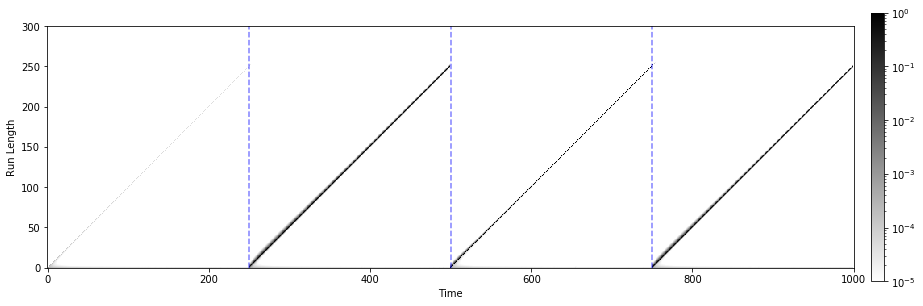

In [10]:
# Create the other figure with run length in the paper
import matplotlib.cm as cm
from matplotlib.colors import LogNorm
import matplotlib.pyplot as plt
import matplotlib as mpl
# mpl.rcParams['figure.dpi'] = 300
            
fig, ax = plt.subplots(1,1,figsize=(15, 10))
ax.imshow(plot_mat,interpolation='nearest',cmap=cm.Greys,norm=LogNorm(vmin=1e-5,vmax=1))

ymax = 300
        
for r in [250,500,750]:
    ax.plot([r,r],[0, ymax],'b',linestyle='--',alpha=0.5)

ax.invert_yaxis()
ax.set_ylim((0,ymax))
ax.set_ylabel("Run Length")
ax.set_xlabel("Time")
fig.colorbar(cm.ScalarMappable(norm=LogNorm(vmin=1e-5,vmax=1), cmap=cm.binary), ax=ax, orientation="vertical", pad=0.02, fraction=0.018/1.121)

plt.show()

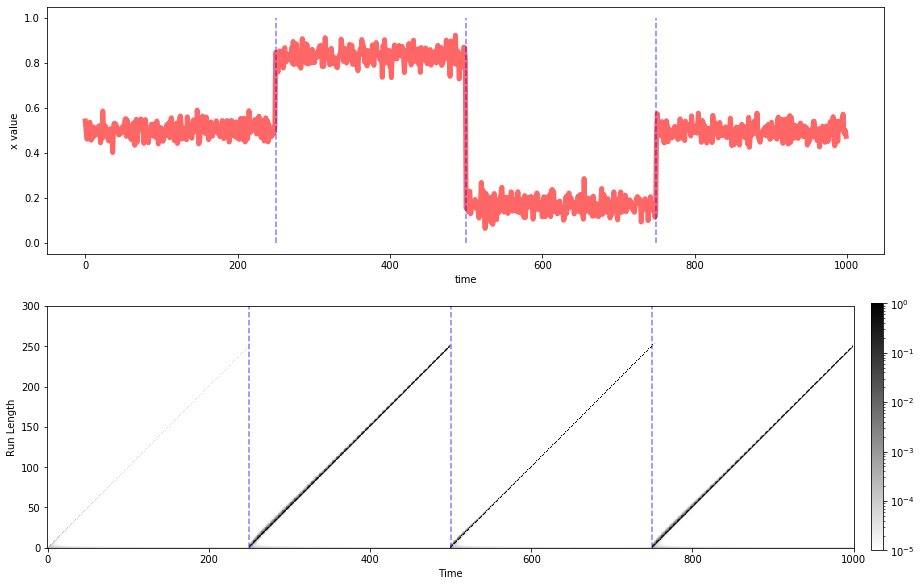

In [11]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2,1,figsize=(15, 10))
ax = axs[0]
ax.plot(xs,'r-', lw=5, alpha=0.6, label='t pdf')
for r in [250,500,750]:
    ax.plot([r,r],[0, 1],'b',linestyle='--',alpha=0.5)
ax.set_ylabel('x value')
ax.set_xlabel('time')

ax = axs[1]
ax.imshow(plot_mat,interpolation='nearest',cmap=cm.Greys,norm=LogNorm(vmin=1e-5,vmax=1))

ymax = 300
        
for r in [250,500,750]:
    ax.plot([r,r],[0, ymax],'b',linestyle='--',alpha=0.5)

ax.invert_yaxis()
ax.set_ylim((0,ymax))
ax.set_ylabel("Run Length")
ax.set_xlabel("Time")
fig.colorbar(cm.ScalarMappable(norm=LogNorm(vmin=1e-5,vmax=1), cmap=cm.binary), ax=ax, orientation="vertical", pad=0.02, fraction=0.018/1.121)

plt.show()

# Another set of data

In [12]:
# Generate some data with 0.01 std dev around 0.1, then 0.3, then 0.7, then 0.5
sigma = 0.05 # standard deviation
mu= 0.1 # mean 
a = np.random.normal(mu, sigma, 400)
mu= 0.3 # mean 
b = np.random.normal(mu, sigma, 100)
mu= 0.8 # mean 
c = np.random.normal(mu, sigma, 250)
mu= 0.5 # mean 
d = np.random.normal(mu, sigma, 250)
x_series = np.concatenate([a, b, c, d])

# Run BOCPD

In [13]:
LAMBDA = 100
ALPHA = 0.1
BETA = 1.
KAPPA = 1.
MU = 0.
DELAY = 15
THRESHOLD = 0.5

bocd = BOCD(partial(constant_hazard, LAMBDA),
                StudentT(ALPHA, BETA, KAPPA, MU))
changepoints = []
list_of_p_r = []
for x_t in x_series[:DELAY]:
    bocd.update(x_t)
    list_of_p_r.append(bocd.growth_probs)
    
for x_t in x_series[DELAY:]:
    bocd.update(x_t)    
    if (abs(sum(bocd.growth_probs) -1)>0.0001):
        print("Error: Prob sum is not 1. Sum is", sum(bocd.growth_probs))
    list_of_p_r.append(bocd.growth_probs)
    if bocd.growth_probs[DELAY] >= THRESHOLD:
        changepoints.append(bocd.t - DELAY + 1)
        print("Changepoint found at ",changepoints[-1],"\n")
#         bocd.prune(bocd.t - DELAY)

(1,)
[0.04397077]
(2,)
[0.04411011 0.20735764]
(3,)
[0.04412462 0.20784457 0.32330946]
(4,)
[0.0441546  0.20794692 0.3239753  0.41518714]
(5,)
[0.04411603 0.20772077 0.32381826 0.41697928 0.49533764]
(6,)
[0.04415614 0.2078811  0.32414939 0.41717975 0.49608481 0.56300089]
(7,)
[0.04415211 0.20805104 0.32420134 0.41753465 0.49685501 0.56658411
 0.62693128]
(8,)
[0.04412605 0.20784243 0.32387892 0.41702775 0.49619634 0.56621091
 0.62937813 0.68564736]
(9,)
[0.04404531 0.2072695  0.3224444  0.41399488 0.49240528 0.56033786
 0.62229728 0.67921525 0.73195808]
(10,)
[0.04398806 0.20696588 0.32210335 0.41321777 0.48953139 0.55766723
 0.61713062 0.67262882 0.72422765 0.77329696]
(11,)
[0.0441193  0.20742433 0.32323333 0.41627498 0.49527642 0.56468702
 0.62776085 0.68513477 0.7388109  0.78907993 0.83475601]
(12,)
[0.04409201 0.20765306 0.32336807 0.41634706 0.4955452  0.56484232
 0.62687308 0.68458299 0.73715158 0.78716052 0.83443058 0.87825033]
(13,)
[0.0440146  0.20711465 0.32253261 0.4151554

(159,)
[0.04409538 0.20751445 0.32354539 0.41615079 0.4952655  0.56434985
 0.62725811 0.68495596 0.73817787 0.7872118  0.8345145  0.87869636
 0.92078379 0.96143271 1.00066408 1.03802341 1.07439591 1.10972523
 1.14372501 1.17618299 1.20850079 1.24003692 1.27074474 1.30067162
 1.32960175 1.35826441 1.38582491 1.41227747 1.43793197 1.46444215
 1.48912683 1.51433295 1.53868384 1.56180589 1.58531235 1.60927587
 1.63245645 1.65556193 1.67775938 1.69957423 1.72177959 1.74335757
 1.76471771 1.78617638 1.80701496 1.82467965 1.84521284 1.8647224
 1.88490751 1.90460714 1.9243924  1.94376805 1.96190456 1.98048049
 1.99627987 2.01331129 2.03133081 2.04893444 2.06554671 2.08191978
 2.09965621 2.11394397 2.13126092 2.14861731 2.1658859  2.18188027
 2.19812454 2.21497207 2.2304358  2.24499892 2.26091595 2.2764079
 2.29265256 2.30699778 2.32218544 2.3362915  2.34976422 2.35871544
 2.37397102 2.38935189 2.40426407 2.41940571 2.43438508 2.44675446
 2.46158251 2.47460611 2.48909126 2.49775657 2.5101428  2

 3.95009506 3.9551348 ]
(261,)
[0.04413358 0.20777975 0.32377698 0.41682672 0.49547642 0.56542606
 0.62678739 0.6845445  0.73806013 0.7881442  0.83550812 0.87998102
 0.92236109 0.96178234 0.99937604 1.03158169 1.06509958 1.10000265
 1.13395008 1.16657747 1.19602823 1.22615999 1.25658648 1.28205169
 1.30827386 1.33455349 1.36198512 1.38876853 1.415324   1.43558833
 1.45890841 1.48395778 1.50686892 1.52908105 1.55195149 1.57523343
 1.59590839 1.61715435 1.63597444 1.65797708 1.67963678 1.70103251
 1.72220495 1.74234505 1.76098982 1.77957888 1.79977584 1.81748896
 1.83701548 1.85575245 1.86918803 1.88820224 1.90705508 1.92456275
 1.9427386  1.96078598 1.97443438 1.99078123 2.00729674 2.0240323
 2.04050063 2.05718837 2.07081693 2.08776606 2.10407645 2.11746993
 2.1300101  2.14582593 2.16173697 2.1778445  2.19250874 2.20382323
 2.21752389 2.23221229 2.24760542 2.26202366 2.27711808 2.28974256
 2.30424011 2.31831306 2.33120156 2.34247087 2.35462341 2.36899981
 2.37315364 2.3865582  2.3985392

 3.86956726 3.87466941 3.87222495]
(346,)
[0.0440973  0.20766103 0.32311498 0.41611633 0.49496238 0.56476756
 0.62731354 0.6850923  0.73870784 0.78844212 0.83560529 0.88058071
 0.92328676 0.96324356 1.00262272 1.03958456 1.07550355 1.11047781
 1.14358883 1.17642965 1.20788737 1.23870295 1.26913073 1.29668061
 1.32584053 1.35449892 1.38254078 1.41005263 1.4370322  1.4633602
 1.48924765 1.51484398 1.53998075 1.56474509 1.58661737 1.61058416
 1.63398954 1.65727347 1.67700042 1.69931655 1.72130373 1.74328233
 1.76272281 1.78413682 1.80522212 1.82616947 1.84686148 1.86726731
 1.88091693 1.9006324  1.91673235 1.93614159 1.95534242 1.97409953
 1.99296056 2.0110986  2.02948695 2.04639472 2.06447193 2.0825337
 2.09773605 2.11441124 2.13186994 2.14928052 2.16327305 2.18033175
 2.19727379 2.21257717 2.22701797 2.23871029 2.25237867 2.26867758
 2.28399386 2.29904892 2.31410845 2.32990309 2.33606409 2.3504862
 2.36201847 2.37733978 2.39251614 2.40500884 2.41939847 2.4336912
 2.44628871 2.46032754 2

(421,)
[0.04361383 0.20431325 0.31825619 0.40967067 0.48755104 0.55626287
 0.61788361 0.6747613  0.72690782 0.77626942 0.82156347 0.86510338
 0.90598531 0.94604872 0.98471651 1.02153357 1.05616103 1.09092671
 1.12391166 1.15652294 1.18495581 1.21149448 1.23779851 1.25387041
 1.27734664 1.29734268 1.32123055 1.33444111 1.35265569 1.3675775
 1.37659007 1.39726118 1.41428576 1.42818146 1.44279931 1.45362278
 1.46607016 1.47685622 1.49541617 1.49948505 1.51306598 1.52669172
 1.53991667 1.52812876 1.54168612 1.51915313 1.5332418  1.54354427
 1.54432687 1.55063888 1.56031994 1.57004251 1.57297145 1.57584503
 1.58499824 1.587666   1.58594574 1.58952844 1.5913431  1.59413096
 1.59084183 1.59720786 1.60542963 1.60774676 1.6130984  1.61362532
 1.60206291 1.60211566 1.60587848 1.60374572 1.60353922 1.58869244
 1.59112151 1.59512207 1.60386379 1.60458532 1.60114562 1.60822037
 1.60957283 1.61469496 1.61697309 1.61102584 1.60924863 1.61067005
 1.61485256 1.61743582 1.61684651 1.61354745 1.61846071 

 2.03833156 2.03595815 2.03723672]
(472,)
[0.04369069 0.20498642 0.31919278 0.40956529 0.48715377 0.55545838
 0.61744233 0.67351366 0.72418083 0.77342205 0.81964851 0.86365656
 0.90175218 0.94182265 0.97965919 1.01578403 1.04976143 1.08394644
 1.1174352  1.14988548 1.18102411 1.21164305 1.2413028  1.26960454
 1.29772054 1.32571947 1.35283657 1.37965219 1.4060474  1.43197832
 1.4574519  1.48105808 1.50463079 1.52877128 1.55223068 1.57460568
 1.59704345 1.61911779 1.64125003 1.66274164 1.68425715 1.70478374
 1.7259849  1.74685412 1.76372911 1.78385084 1.80403777 1.82156075
 1.84115201 1.85795591 1.87725842 1.89619472 1.91427433 1.93300067
 1.95155409 1.96969019 1.98743371 2.00303941 2.02091164 2.03772503
 2.05527854 2.07078755 2.08534437 2.09811307 2.11381941 2.13043004
 2.14514295 2.15735482 2.17352176 2.18707294 2.20225072 2.21432163
 2.22490645 2.23629978 2.23369277 2.24329196 2.24889741 2.26080814
 2.25847963 2.26430735 2.26632157 2.26075403 2.27203481 2.27915483
 2.28268787 2.287807

(527,)
[0.04051855 0.18449307 0.28555812 0.36681259 0.43604232 0.496388
 0.55030746 0.60077563 0.64758283 0.69114052 0.7325802  0.77194592
 0.80947723 0.84539382 0.87992138 0.91207012 0.94192245 0.97275177
 1.00279154 1.03195578 1.05921298 1.08555202 1.1122435  1.13776597
 1.16232876 1.18715806 1.21166613 1.18167114 1.15265611 1.12266699
 1.10491338 1.08655596 1.07059907 1.0631198  1.05752277 1.04272737
 1.0376623  1.0192201  1.00243094 0.99105882 0.98046617 0.9724976
 0.96209912 0.95045756 0.94703239 0.93390644 0.92698398 0.92111247
 0.91340101 0.91056245 0.90472378 0.89560477 0.89273477 0.88369802
 0.87279326 0.86543589 0.85726708 0.85058124 0.84810787 0.84330244
 0.8386339  0.83236354 0.82825131 0.82558194 0.81917989 0.81364364
 0.80752863 0.80559648 0.798553   0.78970796 0.78509795 0.78123278
 0.77571622 0.76889824 0.76275336 0.75745211 0.75163887 0.74616549
 0.74137944 0.73352946 0.72740129 0.72189359 0.71597081 0.70933652
 0.70288825 0.69648583 0.69193246 0.68709382 0.68117099 0.

[0.04036488 0.18400368 0.28429103 0.36446874 0.43306484 0.4936836
 0.54838402 0.59863545 0.64455985 0.68823585 0.72931762 0.76611173
 0.80318727 0.83804595 0.87216965 0.90500018 0.93647075 0.96685337
 0.99604197 1.02495774 1.05298621 1.07957125 1.10544256 1.13156148
 1.1569304  1.181929   1.20550138 1.22911181 1.25241549 1.2751274
 1.29777551 1.31651102 1.33837894 1.35973519 1.37661386 1.39711532
 1.41657792 1.43659449 1.45626667 1.47589641 1.49486685 1.51398717
 1.53230264 1.54893631 1.56725284 1.58289938 1.59992437 1.61721107
 1.63473385 1.65199663 1.6690877  1.6861018  1.70293514 1.71881837
 1.73527127 1.75033577 1.76420884 1.78019279 1.79599114 1.81126621
 1.82619623 1.84165487 1.85656573 1.87177363 1.88655802 1.90025114
 1.91212838 1.92678368 1.94135468 1.95583144 1.9690505  1.98196912
 1.99602418 2.00943143 2.0223244  2.03604381 2.04921792 1.97083437
 1.89734151 1.82531525 1.7753446  1.72658279 1.68352326 1.65509166
 1.63083042 1.59418848 1.57316837 1.53389418 1.49834386 1.471666

[0.04079094 0.1860519  0.2881538  0.37024305 0.44019481 0.50148925
 0.55640176 0.60745519 0.65159848 0.69423954 0.73591429 0.77512052
 0.81278468 0.84771507 0.88150052 0.91484903 0.94605357 0.97715722
 1.00732443 1.03665516 1.06471656 1.09124284 1.11821318 1.14407171
 1.16964053 1.19435584 1.21881744 1.24307801 1.26674864 1.28920006
 1.30544045 1.32689151 1.34891605 1.36833754 1.38864291 1.40934507
 1.42932297 1.44938939 1.46939073 1.48739085 1.50613986 1.52464229
 1.54362415 1.56218124 1.58043445 1.59838472 1.61645928 1.63256535
 1.64844956 1.66164136 1.6786552  1.69557078 1.70973658 1.72648031
 1.74304455 1.75910823 1.77522152 1.78689159 1.80276055 1.81790742
 1.83144873 1.84610915 1.85704026 1.87221635 1.88501102 1.89711401
 1.91057062 1.9151359  1.92882181 1.94298104 1.94591929 1.95748841
 1.9669504  1.98056953 1.99201056 2.00493954 2.01560774 2.02832722
 2.04166028 2.05454906 2.06595361 2.07840525 2.08714163 2.09698036
 2.10916001 2.12002569 2.13222845 2.14369039 2.15538645 2.1677

(659,)
[0.04007058 0.1820685  0.28145685 0.36051881 0.42798019 0.48634662
 0.54014616 0.58927866 0.63454446 0.67734054 0.71756454 0.75575447
 0.79146315 0.82654646 0.86025165 0.8927139  0.92406303 0.95357457
 0.98263209 1.01107023 1.03402367 1.06046828 1.08676919 1.1079514
 1.13010219 1.15424912 1.17634418 1.19959484 1.2222764  1.24441066
 1.26612509 1.28634567 1.30768736 1.32869675 1.34854807 1.36725207
 1.3854868  1.40353114 1.41684054 1.42985271 1.44706835 1.46564311
 1.48397086 1.50133564 1.51917099 1.53657067 1.55191006 1.56834017
 1.58390736 1.59800756 1.61006298 1.62628054 1.642592   1.65754272
 1.67226936 1.68800781 1.70218017 1.71181974 1.72572122 1.74092085
 1.75588363 1.76814477 1.78287122 1.79581842 1.80856744 1.82084594
 1.83460935 1.84875902 1.86145644 1.87497163 1.88789234 1.90114694
 1.90974084 1.92100969 1.93301183 1.9460677  1.95763287 1.97052444
 1.9803106  1.99327057 2.00588277 2.01365721 2.02582126 2.03329809
 2.04186451 2.0542482  2.066096   2.07784851 2.08795798 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0.0425643  0.19759635 0.30684655 0.39435965 0.46904044 0.53483935
 0.59414232 0.64873738 0.6988294  0.74619871 0.79072123 0.83298951
 0.87349093 0.91204012 0.94926069 0.98448634 1.01911424 1.05231367
 1.08464643 1.11617018 1.14394618 1.1733995  1.20250648 1.23017305
 1.25674621 1.28364486 1.30966051 1.33560558 1.36096902 1.38562419
 1.41020594 1.43408014 1.45582621 1.47885702 1.50029771 1.52261391
 1.54482305 1.56644526 1.58790056 1.60831668 1.6293795  1.64988839
 1.67047465 1.69013225 1.70989526 1.72953179 1.74651576 1.76586957
 1.78500064 1.8036028  1.8201117  1.83854256 1.85637893 1.87148435
 1.88907352 1.90684159 1.92446099 1.93303289 1.94961306 1.96623229
 1.9822549  1.99477706 2.00631875 2.02223607 2.03853641 2.05454898
 2.06984508 2.08528933 2.10064909 2.11626778 2.131002   2.14544633
 2.16076618 2.17363445 2.18855929 2.20106379 2.21588343 2.23035207
 2.24499995 2.25817985 2.27233742 2.28670521 2.2989026  2.31122726
 2.31991436 2.32947036 2.34330358 2.35676433 2.3698649  2.3815

# Plot run length probability evolution

In [14]:
# Construct matrix for plotting
T = 1000
plot_mat = np.zeros((T,T+1))

for i in range(T):
    for j in range(i+1):
        if j>=np.size(list_of_p_r[i]):
            plot_mat[j,i] = 0.
        else:
            plot_mat[j,i] = list_of_p_r[i][j]

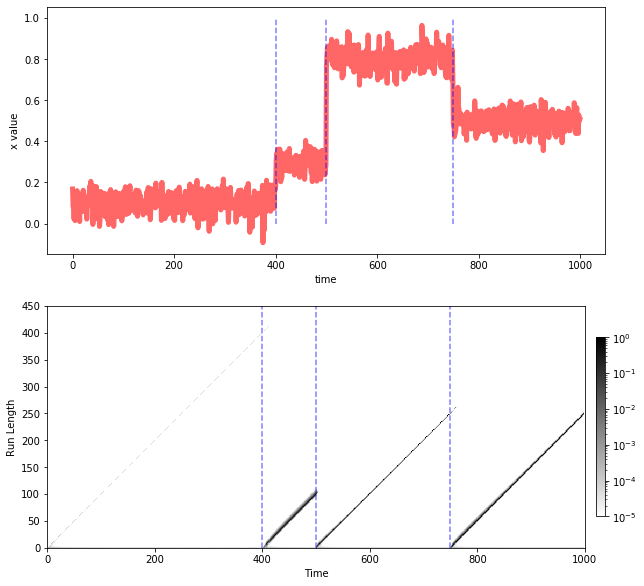

In [15]:
import matplotlib.cm as cm
from matplotlib.colors import LogNorm
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2,1,figsize=(10, 10))
ax = axs[0]
ax.plot(x_series,'r-', lw=5, alpha=0.6, label='t pdf')
for r in [400,500,750]:
    ax.plot([r,r],[0, 1],'b',linestyle='--',alpha=0.5)
ax.set_ylabel('x value')
ax.set_xlabel('time')

ax = axs[1]
ax.imshow(plot_mat,interpolation='nearest',cmap=cm.Greys,norm=LogNorm(vmin=1e-5,vmax=1))

ymax = 450
ax.invert_yaxis()

for r in [400,500,750]:
    ax.plot([r,r],[0, ymax],'b',linestyle='--',alpha=0.5)

ax.set_ylim((0,ymax))
ax.set_ylabel("Run Length")
ax.set_xlabel("Time")
fig.colorbar(cm.ScalarMappable(norm=LogNorm(vmin=1e-5,vmax=1), cmap=cm.binary), ax=ax, orientation="vertical", pad=0.02, fraction=0.018/1.121)

plt.show()

# Another set of data

In [16]:
# Generate some data with 0.01 std dev around 0.1, then 0.3, then 0.7, then 0.5
sigma = 0.05 # standard deviation
mu= 0.1 # mean 
a = np.random.normal(mu, sigma, 400)
mu= 0.2 # mean 
b = np.random.normal(mu, sigma, 50)
mu= 0.3 # mean 
c = np.random.normal(mu, sigma, 50)
mu= 0.8 # mean 
d = np.random.normal(mu, sigma, 250)
mu= 0.5 # mean 
e = np.random.normal(mu, sigma, 250)
x_series = np.concatenate([a, b, c, d, e])

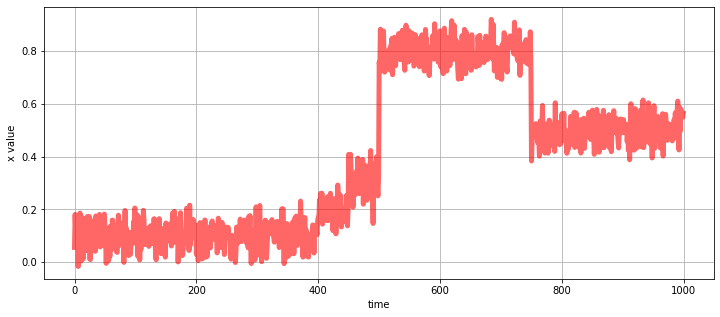

In [17]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 5))
# plt.subplot(121)
plt.plot(x_series,'r-', lw=5, alpha=0.6, label='t pdf')
plt.ylabel('x value')
plt.xlabel('time')
plt.grid('on')
plt.show()

# Run BOCPD

In [18]:
LAMBDA = 100
ALPHA = 0.1
BETA = 1.
KAPPA = 1.
MU = 0.
DELAY = 15
THRESHOLD = 0.5

bocd = BOCD(partial(constant_hazard, LAMBDA),
                StudentT(ALPHA, BETA, KAPPA, MU))
changepoints = []
list_of_p_r = []
for x_t in x_series[:DELAY]:
    bocd.update(x_t)
    list_of_p_r.append(bocd.growth_probs)
    
for x_t in x_series[DELAY:]:
    bocd.update(x_t)    
    if (abs(sum(bocd.growth_probs) -1)>0.0001):
        print("Error: Prob sum is not 1. Sum is", sum(bocd.growth_probs))
    list_of_p_r.append(bocd.growth_probs)
    if bocd.growth_probs[DELAY] >= THRESHOLD:
        changepoints.append(bocd.t - DELAY + 1)
        print("Changepoint found at ",changepoints[-1],"\n")
#         bocd.prune(bocd.t - DELAY)

(1,)
[0.04413654]
(2,)
[0.04394118 0.20623579]
(3,)
[0.04406993 0.20719611 0.32285388]
(4,)
[0.04405318 0.20739524 0.32299372 0.41553825]
(5,)
[0.04413569 0.20767926 0.32360354 0.41530911 0.49435538]
(6,)
[0.04407234 0.20745849 0.32331675 0.41633133 0.49497682 0.56443425]
(7,)
[0.04415593 0.207358   0.32294524 0.4140686  0.49100274 0.55535853
 0.61649217]
(8,)
[0.04410942 0.20742447 0.32314959 0.41607707 0.49503114 0.56475862
 0.62637954 0.68398434]
(9,)
[0.04412708 0.20785402 0.32362518 0.4164914  0.49580447 0.56530716
 0.62810163 0.68385365 0.73740341]
(10,)
[0.04392853 0.20621097 0.32062744 0.40916493 0.48618047 0.55255988
 0.61349223 0.66905633 0.72122015 0.76720681]
(11,)
[0.04406108 0.20713442 0.32280341 0.41561525 0.49266277 0.56214539
 0.62435002 0.68183215 0.73521113 0.78446662 0.83082141]
(12,)
[0.0441574  0.20747959 0.32122942 0.41324305 0.49117438 0.56023436
 0.62111159 0.67787157 0.72849353 0.77585123 0.81654636 0.8598734 ]
(13,)
[0.04405346 0.2069414  0.32238751 0.4145466

 3.26591099]
(164,)
[0.04412047 0.20777277 0.32298264 0.41574076 0.49487771 0.56429245
 0.62659961 0.68432296 0.73789225 0.78796234 0.83503386 0.87942043
 0.92222612 0.96195779 1.00047771 1.03831853 1.07481728 1.10997279
 1.14397579 1.17650519 1.208894   1.23990349 1.27060904 1.30060423
 1.3273671  1.35606562 1.38295304 1.40905309 1.43528189 1.46023482
 1.48516848 1.50824448 1.53033866 1.55204189 1.57621912 1.59863889
 1.62160841 1.64467967 1.66588791 1.6883348  1.71042937 1.73222798
 1.75257199 1.77353801 1.79446282 1.81527686 1.83570838 1.85605572
 1.87620045 1.8928822  1.90593094 1.92527294 1.94443526 1.96310976
 1.98163491 2.00023834 2.01668098 2.0331724  2.04682601 2.06345335
 2.07600219 2.09249113 2.10953555 2.12681559 2.13557402 2.15188016
 2.16551843 2.18216906 2.19857595 2.21497719 2.23096828 2.24613873
 2.26146239 2.27632368 2.29088036 2.30572256 2.32098504 2.33643145
 2.35023887 2.36440709 2.3716431  2.38448906 2.39638127 2.40939207
 2.42407321 2.43864535 2.45010869 2.464334

(266,)
[0.04414651 0.20796065 0.32416881 0.41747924 0.49670152 0.56682703
 0.63009151 0.68753932 0.74124771 0.79162229 0.83860791 0.88317171
 0.92523078 0.96439987 1.00273472 1.03965036 1.07403081 1.10861927
 1.14141844 1.17459965 1.20632932 1.23738829 1.26624264 1.29243169
 1.32154659 1.34641054 1.37374532 1.39948159 1.42432086 1.44512625
 1.47081045 1.49606621 1.5185546  1.5402528  1.56073792 1.58353937
 1.60510088 1.62540823 1.64662662 1.66360482 1.68076185 1.69989615
 1.72104033 1.74138975 1.75856757 1.77890872 1.79616405 1.81602717
 1.83503569 1.85440642 1.87146548 1.88429395 1.9028306  1.92094985
 1.93590153 1.95391022 1.97095375 1.98591446 2.0008601  2.01281856
 2.02838454 2.04553946 2.06216833 2.07721953 2.09229403 2.10892399
 2.12049623 2.13327719 2.14813297 2.16028462 2.16906102 2.17747465
 2.19067072 2.20408324 2.21180094 2.22667504 2.22660677 2.24154701
 2.25594933 2.27026079 2.28130545 2.2823103  2.29594637 2.30801818
 2.31945561 2.33297777 2.344662   2.35862994 2.37247264

 2.33241642]
(344,)
[0.04408272 0.20703071 0.32279888 0.4148095  0.49381169 0.56336586
 0.62620073 0.68348467 0.73702498 0.78676521 0.83390377 0.87831537
 0.92107888 0.96191835 1.00123117 1.03887388 1.07540426 1.11058061
 1.14490599 1.17737816 1.20979728 1.24138505 1.27217818 1.30165372
 1.33058791 1.35909353 1.38726764 1.41400337 1.43813633 1.46381027
 1.48885078 1.51443812 1.53952884 1.56382862 1.58816006 1.61207124
 1.63144605 1.6545108  1.67744246 1.69526205 1.7159271  1.73783409
 1.75861769 1.77996526 1.79829371 1.81457481 1.83439024 1.85054793
 1.87028916 1.8900623  1.90857613 1.92785284 1.94711695 1.96052833
 1.97907061 1.99541969 2.01375838 2.02993342 2.04677457 2.06447992
 2.0816281  2.09922108 2.11598541 2.1332846  2.14905845 2.16597358
 2.18207396 2.19814205 2.21478255 2.23090393 2.24706308 2.26163662
 2.27774179 2.29376633 2.30931756 2.32449234 2.34019426 2.35539181
 2.36854203 2.37761126 2.3920509  2.40540657 2.42027287 2.43326497
 2.44687237 2.46160307 2.47124639 2.481689

 3.81280349 3.81849766 3.81724553]
(418,)
[0.04394613 0.20668828 0.32159549 0.41411737 0.49280456 0.56226658
 0.62506771 0.68244361 0.73589776 0.78597562 0.83299636 0.87635467
 0.91903254 0.9583155  0.99749371 1.03441183 1.07071275 1.10593649
 1.13995723 1.17156016 1.202963   1.2328332  1.26250736 1.2918508
 1.31452056 1.34235185 1.36972368 1.3942569  1.4188677  1.44224099
 1.466077   1.48671777 1.50754128 1.52282711 1.54357394 1.56382605
 1.57812817 1.59948413 1.61824948 1.64003747 1.66098074 1.67972901
 1.69100719 1.70907336 1.72746533 1.74724246 1.76606022 1.78398468
 1.80319309 1.82116678 1.83879017 1.85209208 1.8663934  1.88468699
 1.899509   1.91739065 1.93220983 1.94059631 1.95581024 1.97265063
 1.98562507 1.99637342 2.00366244 2.01824032 2.03180547 2.04645664
 2.05163086 2.06267949 2.07781685 2.09023569 2.09949935 2.10254437
 2.11600304 2.1158996  2.12813322 2.14275962 2.15300662 2.16741834
 2.17887854 2.19238959 2.20214316 2.20902854 2.2208808  2.23432477
 2.24702598 2.2602926

 0.09387455 0.09319033 0.09315411 0.09243243]
(473,)
[0.04359442 0.20361758 0.31704563 0.40826458 0.48577877 0.55422268
 0.61611411 0.67123555 0.72374287 0.77250246 0.81885405 0.86261088
 0.90427567 0.94439421 0.98289153 1.01833219 1.05418558 1.08887966
 1.12182148 1.15092931 1.18178128 1.2122578  1.23857308 1.26541216
 1.28679087 1.30933175 1.33596441 1.35968088 1.38083447 1.4016827
 1.4243283  1.44458004 1.46201202 1.48315746 1.49796113 1.51618498
 1.53794056 1.55744382 1.57317815 1.59349587 1.61442158 1.62782119
 1.64309768 1.65109453 1.66631756 1.6846843  1.70027737 1.71226823
 1.7202042  1.73660777 1.75056609 1.76584255 1.78308932 1.79916789
 1.81311022 1.82527953 1.83527486 1.85112902 1.860707   1.87440127
 1.88745574 1.89809128 1.91151536 1.92109267 1.93066033 1.937353
 1.95208862 1.96202748 1.97647642 1.9858106  1.99905037 2.00617277
 2.01432363 2.02082435 2.02085315 2.02353896 2.02377405 2.02608006
 2.02996075 2.01855608 2.02200472 2.02595155 2.02304451 2.02175419
 2.0187998  

(528,)
[0.04084793 0.18609887 0.28738782 0.36910952 0.43840044 0.50010509
 0.55458664 0.6048061  0.65144013 0.69574076 0.7369615  0.7761339
 0.81392488 0.84957914 0.88419085 0.91761735 0.94985808 0.98076325
 1.01096215 1.04006016 1.06520916 1.09197704 1.11893412 1.14376327
 1.16951719 1.19055761 1.21522367 1.23937529 1.22333246 1.19592084
 1.17738366 1.17673391 1.1619459  1.1537288  1.13900751 1.12645712
 1.12447635 1.09592217 1.08539316 1.07769783 1.07226389 1.0747803
 1.07162699 1.06762088 1.06115243 1.05761722 1.04814028 1.03649344
 1.02775283 1.02597712 1.02136318 1.01260895 1.00900581 0.99775437
 0.99699638 0.99080557 0.98952744 0.9859695  0.97929123 0.97521829
 0.96716577 0.96107193 0.95988918 0.95488023 0.95131206 0.9462875
 0.94204183 0.93398374 0.92880328 0.92174531 0.91182049 0.90602689
 0.89986679 0.89612241 0.89479259 0.88659929 0.88217791 0.8806798
 0.87118357 0.85939557 0.8488208  0.84179382 0.83289892 0.82320832
 0.81386176 0.80585922 0.79706388 0.78761424 0.78002225 0.7

[0.0396919  0.17992532 0.27718192 0.35524283 0.4213108  0.47943547
 0.53242582 0.58022904 0.62522905 0.66724918 0.70466781 0.74228066
 0.7773128  0.81136996 0.84201344 0.87343174 0.90247945 0.93209944
 0.95774227 0.98211638 1.00878068 1.03246325 1.05811054 1.08124606
 1.10530904 1.1268659  1.14718497 1.17014015 1.19244959 1.21105981
 1.23253554 1.25382597 1.27479098 1.29475019 1.30932646 1.32537087
 1.34485414 1.3630361  1.38207004 1.39802307 1.41533422 1.43011969
 1.44691745 1.46123658 1.47866752 1.49438533 1.50884976 1.52376797
 1.539758   1.55093505 1.56559274 1.58139621 1.59540312 1.61014008
 1.61735037 1.63235098 1.64658136 1.66036715 1.6682355  1.68124755
 1.69375338 1.70290534 1.71508325 1.72538114 1.73249465 1.74194811
 1.75282115 1.75839193 1.76882531 1.7823959  1.79412408 1.80323555
 1.81538519 1.82048703 1.83361166 1.83952298 1.84706539 1.77795248
 1.69907154 1.63794582 1.60485039 1.55589647 1.51812144 1.47510731
 1.43711271 1.41326571 1.36265181 1.33280146 1.30741532 1.2856

(624,)
[0.03954611 0.17906097 0.2758579  0.35308359 0.41912215 0.47757406
 0.52946874 0.57559325 0.61992174 0.65909787 0.69826285 0.73300673
 0.7643832  0.79450192 0.82655184 0.85711813 0.88731567 0.91596769
 0.9385106  0.96166047 0.98682445 1.00934215 1.02966551 1.05409497
 1.07591948 1.09771887 1.11640171 1.13617254 1.15771553 1.17745818
 1.19582811 1.21555174 1.23615078 1.25224726 1.26948845 1.28845237
 1.30437581 1.31955767 1.3343227  1.35064694 1.36322405 1.37186808
 1.38553189 1.39706638 1.40862236 1.42443049 1.43959238 1.45595109
 1.47001161 1.47780554 1.49249557 1.50404495 1.51577847 1.53054927
 1.5417836  1.55561438 1.56881889 1.5762228  1.58974283 1.60082563
 1.61339507 1.62129199 1.63371927 1.64319616 1.65641511 1.6630684
 1.66907893 1.68098458 1.68841186 1.70120006 1.70983207 1.72132357
 1.72907189 1.73563041 1.74813693 1.75986251 1.76576302 1.77734594
 1.78945361 1.80198685 1.81231524 1.81492926 1.82004555 1.83138828
 1.8405594  1.85214237 1.85857758 1.86744072 1.87286455 

[0.04064157 0.18454776 0.28618468 0.36726263 0.43597007 0.49730097
 0.55267962 0.60343842 0.65061806 0.69479571 0.73648389 0.77600066
 0.81371109 0.84974967 0.88298911 0.91608262 0.94771016 0.97889116
 1.00913632 1.03710967 1.06456024 1.09170819 1.11876797 1.1429917
 1.16813426 1.19320902 1.21506031 1.23914764 1.26239768 1.28542757
 1.30639181 1.32747056 1.34950874 1.37039837 1.39157537 1.41236386
 1.4315309  1.45156906 1.47157258 1.49125991 1.50937512 1.52860587
 1.54761628 1.5617355  1.58030326 1.598569   1.61651945 1.62821404
 1.64233017 1.65964953 1.67673072 1.69263221 1.70933562 1.72399592
 1.74049922 1.75624836 1.77216794 1.78625435 1.8008337  1.81220351
 1.82607833 1.84053235 1.85565031 1.87019326 1.88526548 1.89992038
 1.91090703 1.9253193  1.93924826 1.95365977 1.96787503 1.97940827
 1.99292069 2.00680627 2.01920522 2.02667494 2.04036522 2.05365093
 2.06430125 2.07760443 2.0908888  2.10409688 2.11647515 2.12943378
 2.14093875 2.15378673 2.16648984 2.17917043 2.18966184 2.20070

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0.04263999 0.19812855 0.30753678 0.39553112 0.47042944 0.53658425
 0.59639457 0.65106224 0.70184821 0.74948001 0.79447951 0.8368808
 0.87659427 0.91539456 0.95182033 0.98722362 1.0202802  1.05262223
 1.08499873 1.11652837 1.14667042 1.1758003  1.20419564 1.23267662
 1.26011956 1.28626292 1.31291815 1.33872162 1.36436209 1.38950736
 1.41318025 1.43412733 1.45741579 1.48044617 1.5006115  1.52310481
 1.54537509 1.56680497 1.58851131 1.60918541 1.62575505 1.64618161
 1.66642131 1.68653591 1.70616707 1.72585193 1.74514157 1.76443975
 1.78241773 1.79540882 1.81106909 1.82889689 1.84609971 1.86124354
 1.87867295 1.89618582 1.91371931 1.93014474 1.94635895 1.96211217
 1.97897829 1.99504803 2.00809739 2.02282178 2.03732725 2.05142967
 2.06744757 2.0833445  2.09897024 2.10928608 2.12479106 2.13562539
 2.15056205 2.16379484 2.17881657 2.1932706  2.20782712 2.2220284
 2.23649361 2.25099252 2.26541715 2.27855721 2.29279139 2.30692657
 2.32099208 2.33491178 2.347457   2.36081311 2.37451936 2.386577

# Plot run length probability evolution

In [19]:
# Construct matrix for plotting
T = 1000
plot_mat = np.zeros((T,T+1))

for i in range(T):
    for j in range(i+1):
        if j>=np.size(list_of_p_r[i]):
            plot_mat[j,i] = 0.
        else:
            plot_mat[j,i] = list_of_p_r[i][j]

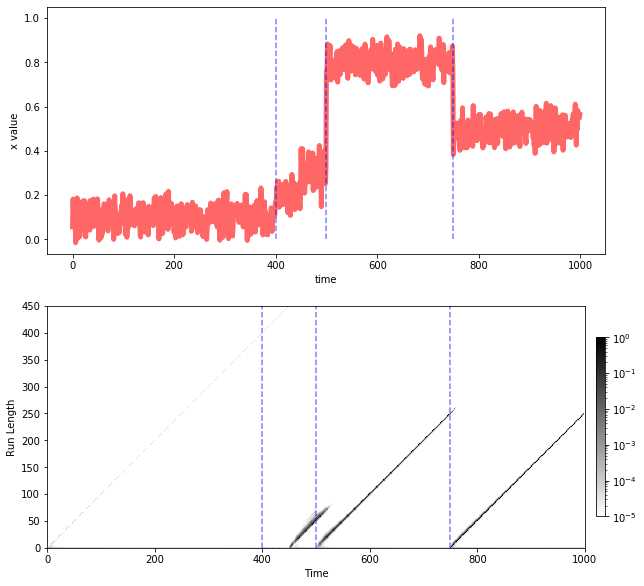

<Figure size 432x288 with 0 Axes>

In [21]:
import matplotlib.cm as cm
from matplotlib.colors import LogNorm
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2,1,figsize=(10, 10))
ax = axs[0]
ax.plot(x_series,'r-', lw=5, alpha=0.6, label='t pdf')
for r in [400,500,750]:
    ax.plot([r,r],[0, 1],'b',linestyle='--',alpha=0.5)
ax.set_ylabel('x value')
ax.set_xlabel('time')

ax = axs[1]
ax.imshow(plot_mat,interpolation='nearest',cmap=cm.Greys,norm=LogNorm(vmin=1e-5,vmax=1))

ymax = 450
ax.invert_yaxis()

for r in [400,500,750]:
    ax.plot([r,r],[0, ymax],'b',linestyle='--',alpha=0.5)

ax.set_ylim((0,ymax))
ax.set_ylabel("Run Length")
ax.set_xlabel("Time")
fig.colorbar(cm.ScalarMappable(norm=LogNorm(vmin=1e-5,vmax=1), cmap=cm.binary), ax=ax, orientation="vertical", pad=0.02, fraction=0.018/1.121)

plt.show()

plt.savefig('../figures/inaccurate_run_length_pred.png')


# Sanity check the probabilities

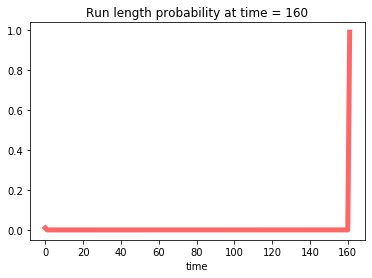

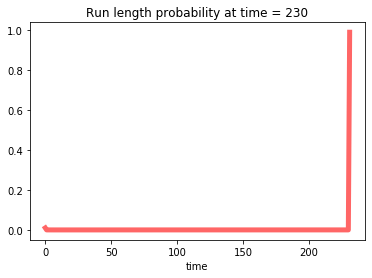

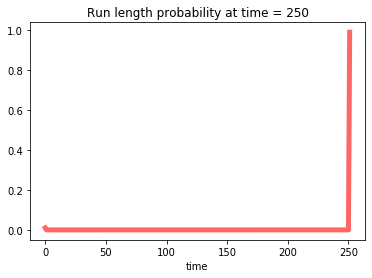

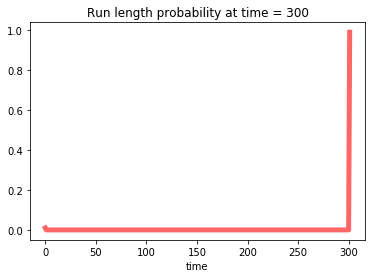

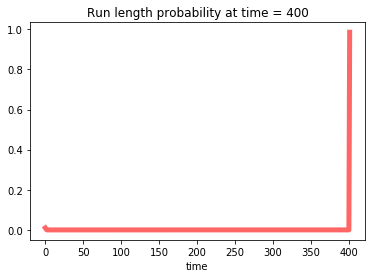

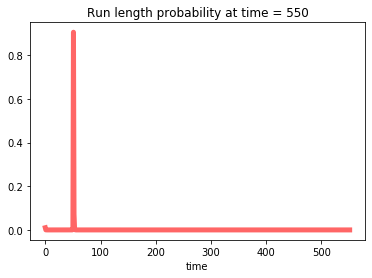

In [13]:
times = [160, 230, 250, 300, 400, 550]
for time in times:
    plt.plot(list_of_p_r[time],'r-', lw=5, alpha=0.6, label='run length pdf')
    plt.title('Run length probability at time = %d'%time)
    plt.xlabel('time')
    plt.show()

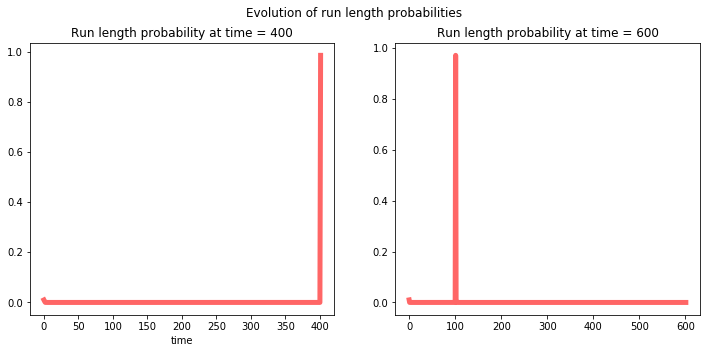

In [14]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 5))

plt.subplot(121)
time = 400
plt.plot(list_of_p_r[time],'r-', lw=5, alpha=0.6, label='run length pdf')
plt.title('Run length probability at time = %d'%time)
plt.xlabel('time')
plt.subplot(122)
time = 600
plt.plot(list_of_p_r[time],'r-', lw=5, alpha=0.6, label='run length pdf')
plt.title('Run length probability at time = %d'%time)
plt.suptitle('Evolution of run length probabilities')
plt.show()

# fig, ax = plt.subplots(1, 2)
# plt.plot(x,'r-', lw=5, alpha=0.6, label='t pdf')
# plt.ylabel('some numbers')
# plt.show()